## Loading pregenerated signals

In [1]:
import seaborn as sns

sns.set_style('whitegrid')

from scipy.io import loadmat

from importlib import reload

import pymultifracs.bivariate
reload(pymultifracs.bivariate)
from pymultifracs.bivariate import bivariate_analysis_full

import numpy as np

import matplotlib.pyplot as plt

from collections import defaultdict

import pyvista as pv

In [38]:
sns.set_context('notebook')

In [2]:
names = ['nossnoMF', 'nossMF', 'ssMF', 'ssnoMF']

data = {
    key: loadmat(f'../tests/data/DataSet_{key}.mat')['data'].transpose() for key in names
}

param = {
    key: loadmat(f'../tests/data/DataSet_{key}.mat')['params'] for key in names
}

param = {
    key: {
        param[key].dtype.names[i]: param[key][0, 0][i] for i in range(len(param[key][0, 0]))
    }
    for key in param
}

In [3]:
def plot_key(key, plot=True):
    
    X = data[key].copy()

    j1 = 3
    j2 = np.log2(X.shape[0]) - 3
    p_exp=2
    gamint = 1

    dwt, lwt = bivariate_analysis_full(X[:, 0], X[:, 1], p_exp=p_exp, j1=j1, j2=j2, gamint=gamint, weighted=True, n_cumul=2,
                                       q1=np.array([0, 1, 2]), q2=np.array([0, 1, 2]))
    
    if not plot:
        return dwt, lwt
    
    print(f'{lwt.cumulants.rho_mf=}')
    
    fig_m, fig_c = lwt.cumulants.plot()
    fig_m.suptitle(key)
    fig_c.suptitle(key)
    lwt.cumulants.plot_legendre(resolution=30)
    plt.suptitle(key)
    plt.show()
    
    plt.plot(dwt.structure.j, dwt.structure.coherence, label='second order (wavelet) coherence')
    plt.plot(lwt.cumulants.j, lwt.cumulants.RHO_MF, label=r'multifractal (leader) coherence')
    plt.xlabel('j')
    plt.title(key)
    plt.legend()
    plt.show()
    
    return dwt, lwt

In [ ]:
key = 'nossMF'

X1 = data[key][:, 0]
X2 = data[key][:, 1]

fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(X1, c='C0')
ax[0].set_ylabel('X1')
ax[1].plot(X2, c='C1')
ax[1].set_ylabel('X2')
ax[1].set_xlabel('t')

plt.suptitle('Signals')
plt.savefig(f'figures/{key}_signals.pdf')
plt.show()

In [25]:
from pymultifracs.mfa import mf_analysis_full
from pymultifracs.utils import build_q_log

In [27]:
q = build_q_log(1, 10, 20)

In [32]:
dwt1, lwt1 = mf_analysis_full(X1, j1=3, j2=15, p_exp=2, gamint=1, weighted=True, n_cumul=2, q=q)

In [33]:
dwt2, lwt2 = mf_analysis_full(X2, j1=3, j2=15, p_exp=2, gamint=1, weighted=True, n_cumul=2, q=q)

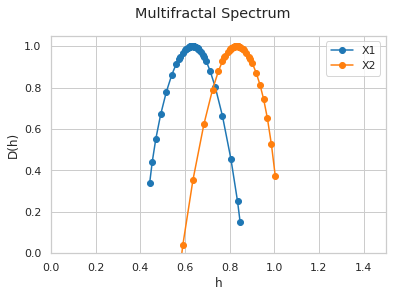

In [59]:
fig, ax = plt.subplots(1, 1)
lwt1.spectrum.plot(ax=ax, fmt='C0o-', label='X1')
lwt2.spectrum.plot(ax=ax, fmt='C1o-', label='X2')
plt.legend()
plt.suptitle('Multifractal Spectrum')
plt.savefig(f'figures/{key}_univspec.pdf')

In [4]:
dwt, lwt = plot_key('nossMF', False)

In [5]:
cpos = [(0.7514069290810343, 1.0210791138174, 1.9480202920112626),
 (0.8390226662158966, 0.63082654774189, 0.37456775456666946),
 (0.0, 0.0, 1.0)]

In [6]:
pv.set_plot_theme("document")

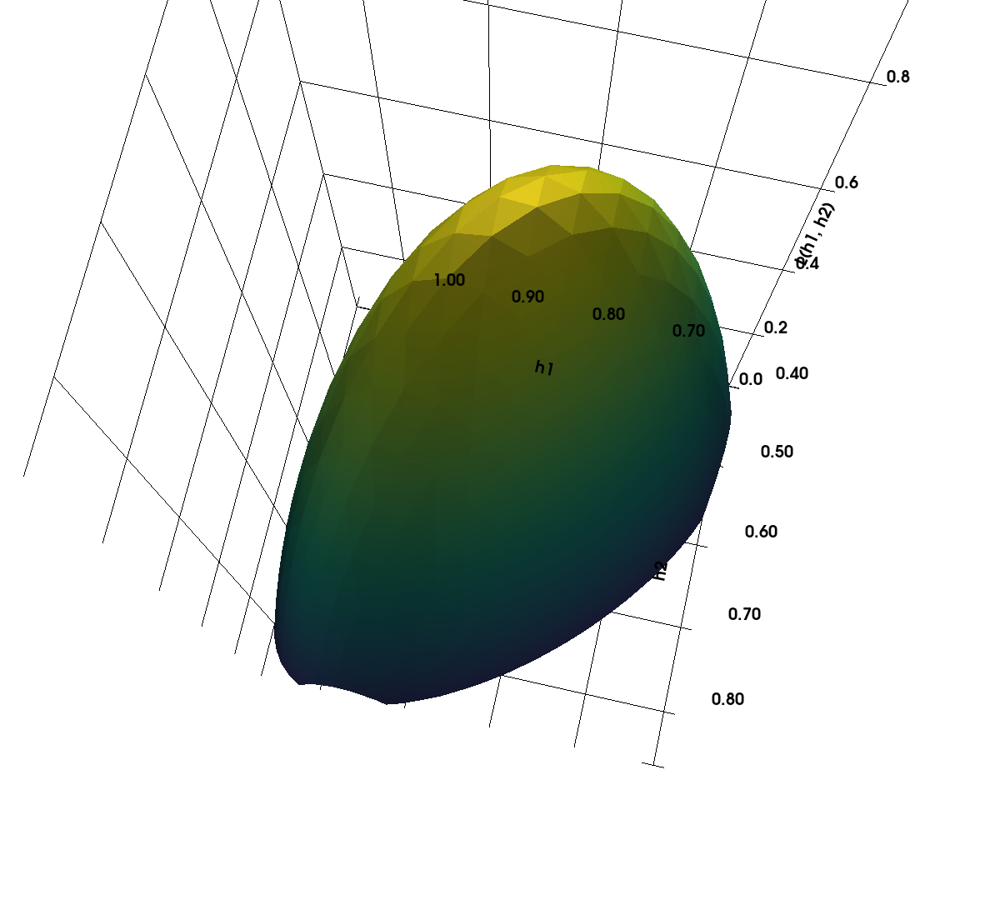

[(0.7514069290810343, 1.0210791138174, 1.9480202920112626),
 (0.8390226662158966, 0.63082654774189, 0.37456775456666946),
 (0.0, 0.0, 1.0)]


In [7]:
lwt.cumulants.plot_legendre_pv(use_ipyvtk=False, cpos=cpos, location='origin')

lwt.cumulants.rho_mf=array([-0.04630067])


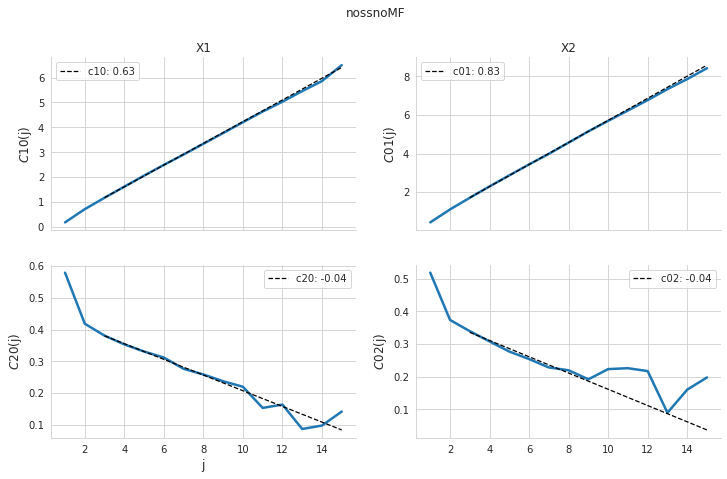

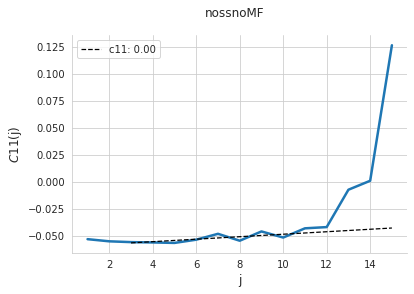

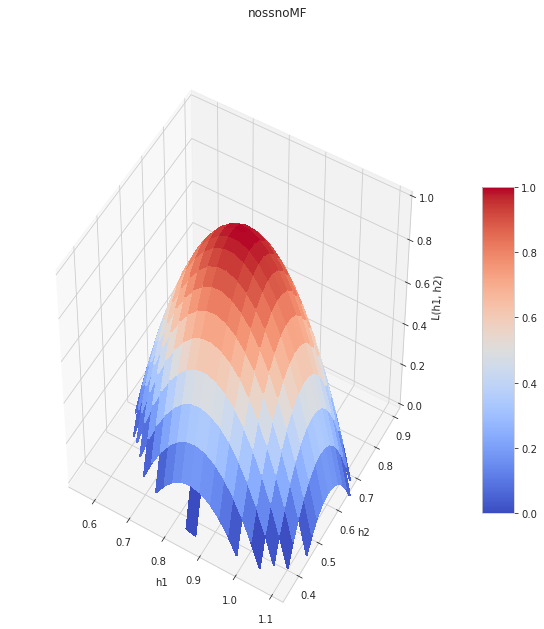

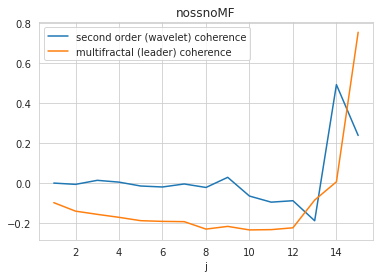

lwt.cumulants.rho_mf=array([0.61084336])


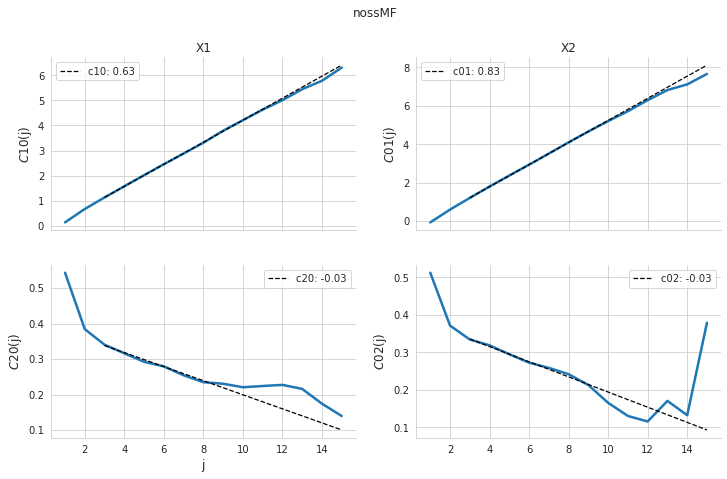

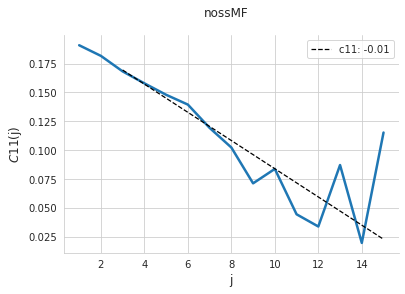

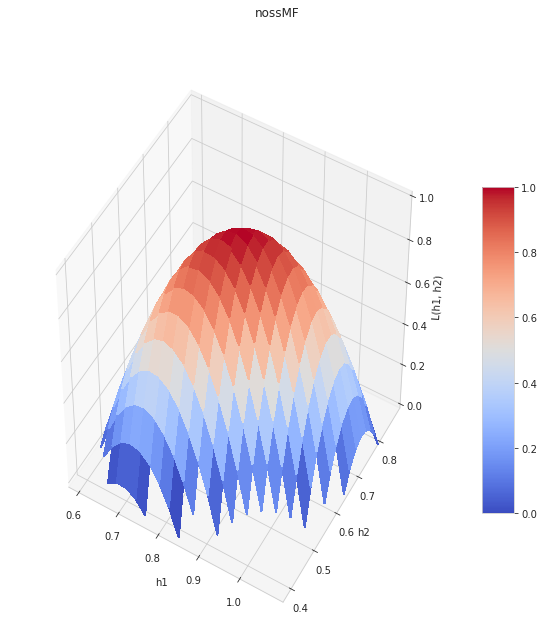

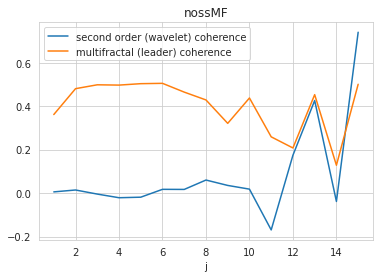

lwt.cumulants.rho_mf=array([0.70372861])


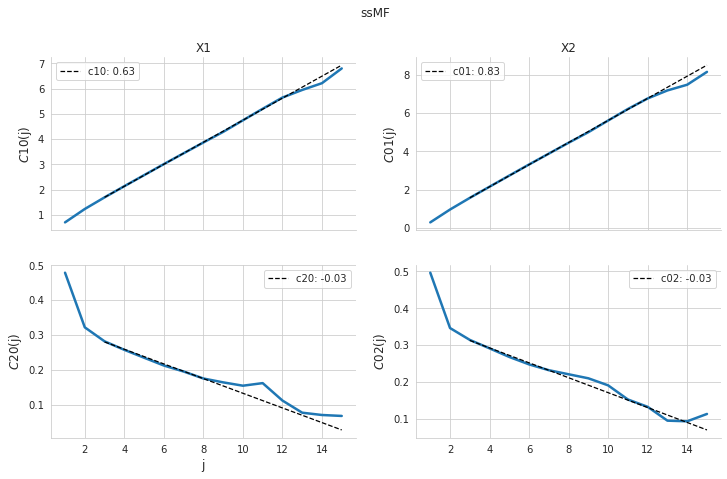

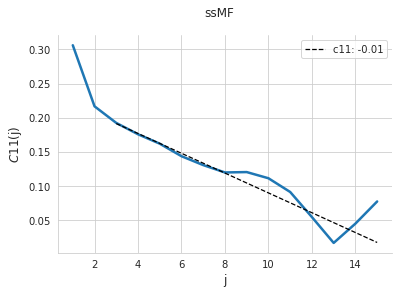

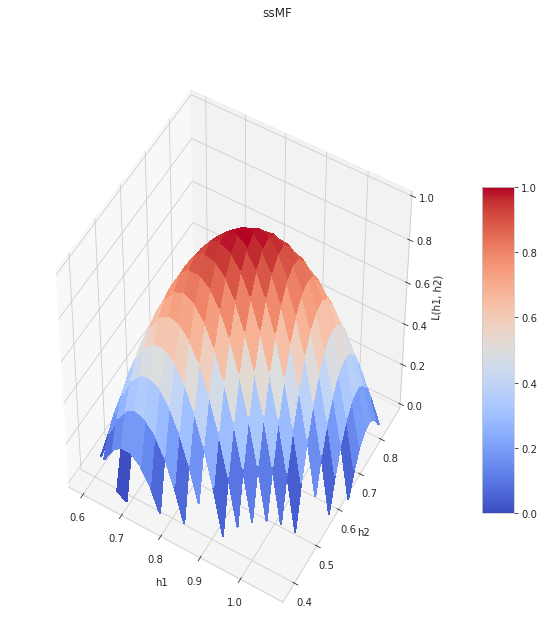

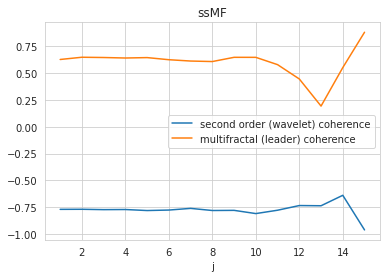

lwt.cumulants.rho_mf=array([0.01734741])


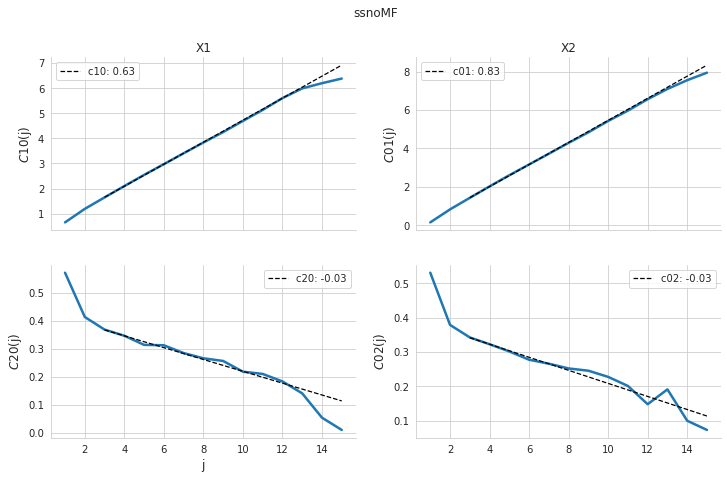

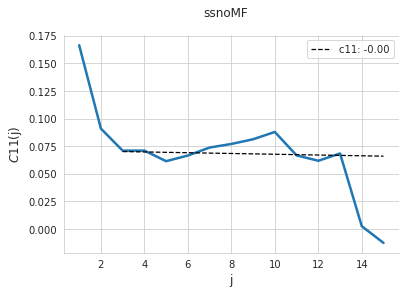

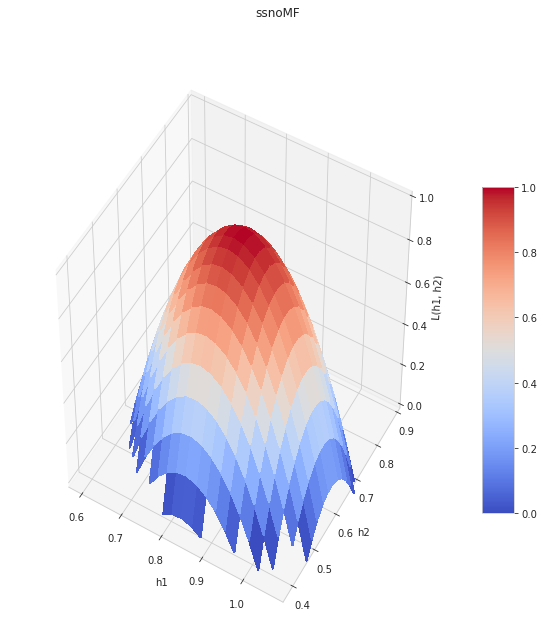

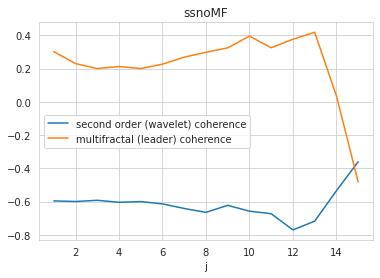

In [8]:
for key in data:
    plot_key(key)

## Real data

In [65]:
subject = 'pl170230'
seg = ('p1', 'Run01')

In [69]:
from megfractal.study import Study

In [70]:
S = Study.from_pickle('/neurospin/meg/meg_tmp/ScaledTime_Dragana_2019/MEG/study_sensor_mf.pkl')

In [71]:
df = [*S.conditions.loc[subject, seg].data.get_df()][0]

In [73]:
sensor = 'MEG1911'

In [160]:
p_exp = 2
j1 = 10
j2 = 14
gamint = 1.0

In [161]:
df

channel,MEG0113,MEG0112,MEG0111,MEG0122,MEG0123,MEG0121,MEG0132,MEG0133,MEG0131,MEG0143,...,MEG2611,MEG2623,MEG2622,MEG2621,MEG2633,MEG2632,MEG2631,MEG2642,MEG2643,MEG2641
time,,,,,,,,,,,,,,,,,,,,,
0,6.713377e-12,-6.481451e-12,9.712603e-13,5.007175e-12,3.194358e-11,2.453283e-13,-1.531244e-11,2.456639e-11,9.050287e-13,1.380982e-12,...,3.884979e-13,-1.482348e-11,1.026991e-11,3.271831e-13,-2.231562e-11,2.027187e-11,-1.677932e-13,-2.270211e-11,2.468073e-12,5.577859e-13
0,6.477355e-12,-6.387285e-12,7.248913e-13,6.005880e-12,2.870661e-11,4.340628e-14,-1.530510e-11,2.383751e-11,5.735289e-13,2.823963e-12,...,4.466698e-13,-1.689224e-11,1.224420e-11,3.151735e-13,-3.022884e-11,1.897354e-11,-1.743028e-13,-2.271320e-11,-7.189884e-12,7.401454e-13
1,3.963854e-12,-1.575851e-12,7.320501e-13,7.806331e-12,2.769728e-11,1.193843e-13,-8.936755e-12,2.020960e-11,5.530887e-13,4.018300e-12,...,4.782285e-13,-2.030141e-11,1.593482e-11,2.272993e-13,-3.663966e-11,2.000560e-11,-3.187961e-13,-1.921934e-11,-1.056850e-11,8.072097e-13
2,5.189029e-12,-7.461006e-15,1.023745e-12,1.012129e-11,3.085438e-11,2.861341e-13,-2.766538e-12,2.363412e-11,8.782672e-13,2.467314e-12,...,5.112376e-13,-2.111793e-11,1.563529e-11,2.329397e-13,-3.318735e-11,2.122494e-11,-3.335916e-13,-1.886591e-11,-5.718009e-12,7.693036e-13
2,5.700115e-12,1.370581e-12,1.225127e-12,9.349156e-12,3.726930e-11,3.246087e-13,-3.087018e-12,3.268470e-11,1.199664e-12,-3.774245e-12,...,4.589826e-13,-1.868508e-11,9.795305e-12,2.192076e-13,-2.546071e-11,1.882170e-11,-2.395230e-13,-2.306218e-11,-9.835639e-13,6.822370e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101953,-1.048756e-11,1.040761e-11,4.496729e-13,6.444155e-12,3.594876e-11,1.020053e-13,-1.665801e-12,2.177724e-11,7.152146e-13,-8.331668e-12,...,2.781578e-13,-1.131578e-11,2.789497e-11,-2.765563e-13,-1.604123e-11,2.562946e-11,-1.030064e-12,-1.833031e-11,1.732387e-11,-5.408370e-14
101954,-7.649632e-12,1.010877e-11,2.488741e-13,-4.201465e-12,3.624898e-11,9.073796e-14,-6.924283e-12,1.943798e-11,6.860301e-13,-9.441516e-12,...,2.629153e-13,-9.076938e-12,2.888019e-11,-2.665661e-13,-1.359670e-11,2.370472e-11,-1.012314e-12,-1.541426e-11,1.842520e-11,-1.187750e-13
101954,-9.103002e-12,1.141307e-11,1.913668e-13,-4.355228e-12,3.729521e-11,-3.617595e-14,6.188901e-12,1.699259e-11,5.529658e-13,-1.530575e-11,...,5.971384e-13,-1.119235e-11,3.357982e-11,-3.109532e-14,-1.679580e-11,2.761555e-11,-8.967171e-13,-1.551504e-11,2.548620e-11,1.290383e-13


In [162]:
np.seterr(all = "warn")

{'divide': 'warn', 'over': 'warn', 'under': 'warn', 'invalid': 'warn'}

In [163]:
np.seterr()

{'divide': 'warn', 'over': 'warn', 'under': 'warn', 'invalid': 'warn'}

In [164]:
sensor = 'MEG0811'

In [166]:
import pandas as pd

In [329]:
d = {}

for s in df:
    if s == sensor:
        continue
    
    dwt, lwt = bivariate_analysis_full(df[sensor].values, df[s].values, p_exp=p_exp, j1=j1, j2=j2, gamint=gamint, weighted=False, n_cumul=2,
                                       q1=np.array([0, 1, 2]), q2=np.array([0, 1, 2]))
    
#     print(s)
#     print(lwt.cumulants.c02)
#     print(lwt.cumulants.c20)
#     print(lwt.cumulants.rho_mf)
#     print('----------')

    d[s] = {'c02': lwt.cumulants.c02, 'c20': lwt.cumulants.c20, 'rho_mf': lwt.cumulants.rho_mf}

invalid value encountered in sqrt


In [330]:
df2 = pd.DataFrame(d).transpose()

In [331]:
df2 = df2.applymap(lambda x: x[0])

In [333]:
df2.loc[df2.c02 < 0].sort_values(by='rho_mf', ascending=True).head(40)

,c02,c20,rho_mf
MEG2612,-0.000302,-0.023477,-3.679729
MEG0232,-0.000034,-0.023477,-3.424724
MEG1522,-0.001459,-0.023477,-2.451697
MEG2012,-0.002950,-0.023477,-2.206874
MEG2642,-0.008941,-0.023477,-2.090302
MEG1611,-0.002860,-0.023477,-1.920536
MEG1421,-0.005596,-0.023477,-1.868124
MEG1141,-0.001273,-0.023477,-1.621462
MEG1422,-0.001797,-0.023477,-1.603111
MEG0341,-0.011198,-0.023477,-1.445532


In [231]:
from scipy.signal import butter, sosfiltfilt

In [209]:
fs = 2000

In [248]:
sos = butter(4, scale2freq(10, 2000), fs=fs, output='sos')

In [246]:
from megfractal.utils import scale2freq

In [343]:
X1 = sosfiltfilt(sos, df.MEG0811.values)
X2 = sosfiltfilt(sos, df.MEG2211.values)

In [376]:
scale2freq(10, 2000)

1.46484375

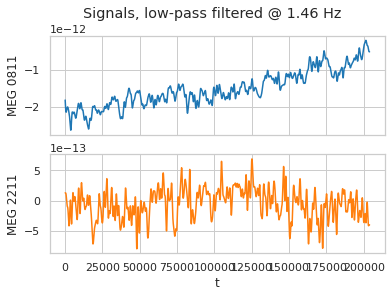

In [378]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(X1)
ax[0].set_ylabel('MEG 0811')
ax[1].plot(X2, c='C1')
ax[1].set_ylabel('MEG 2211')
ax[1].set_xlabel('t')
plt.suptitle('Signals, low-pass filtered @ 1.46 Hz')
plt.savefig('figures/bivar/signals.pdf', bbox_inches='tight')
plt.show()

In [354]:
dwt1, lwt1 = mf_analysis_full(df.MEG0811, j1=j1, j2=j2, p_exp=2, gamint=1, weighted=False, n_cumul=2, q=q)

In [356]:
dwt2, lwt2 = mf_analysis_full(df.MEG2211, j1=j1, j2=j2, p_exp=2, gamint=1, weighted=False, n_cumul=2, q=q)

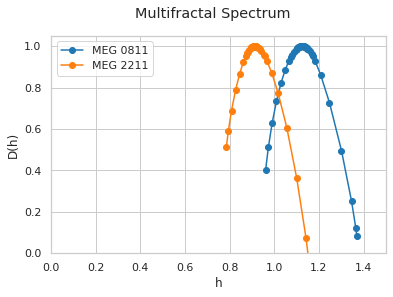

In [368]:
fig, ax = plt.subplots(1, 1)
lwt1.spectrum.plot(ax=ax, fmt='C0o-', label='MEG 0811')
lwt2.spectrum.plot(ax=ax, fmt='C1o-', label='MEG 2211')
plt.legend()
# plt.xlim([0.8, 2])
plt.suptitle('Multifractal Spectrum')
plt.savefig(f'figures/bivar/univspec.pdf', bbox_inches='tight')

In [359]:
dwt, lwt = bivariate_analysis_full(df[sensor].values, df['MEG2211'].values, p_exp=p_exp, j1=j1, j2=j2, gamint=gamint, weighted=False, n_cumul=2,
                                   q1=np.array([0, 1, 2]), q2=np.array([0, 1, 2]))

In [374]:
lwt.cumulants.rho_mf

array([-0.74073479])

(<Figure size 864x504 with 4 Axes>, <Figure size 432x288 with 1 Axes>)

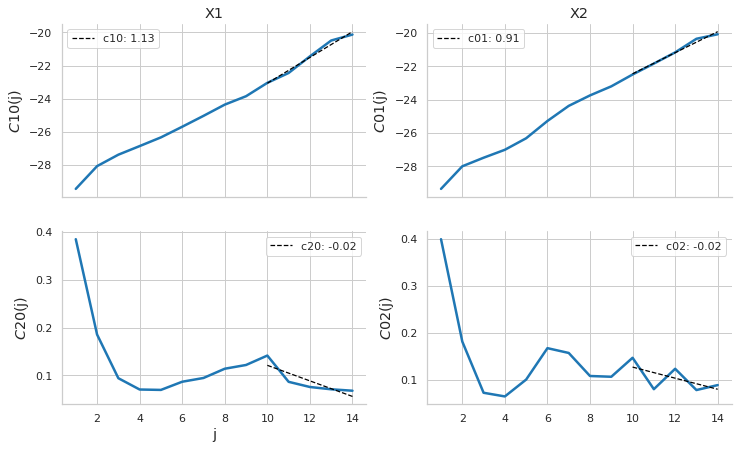

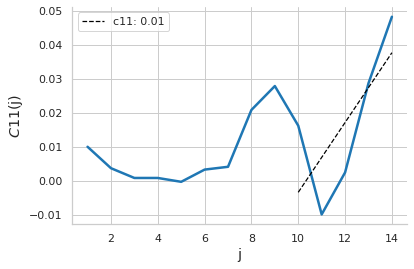

In [360]:
lwt.cumulants.plot()

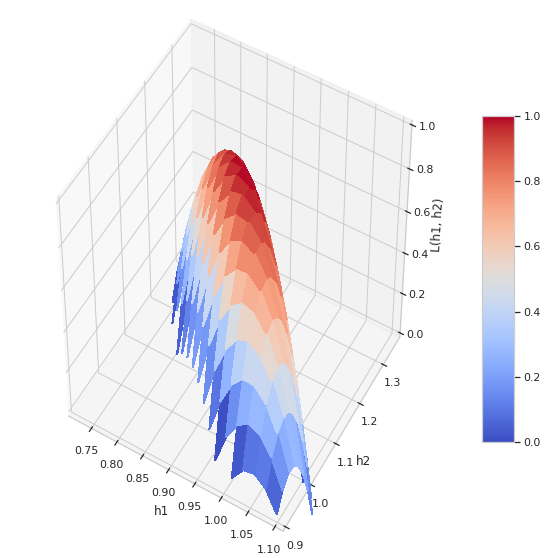

In [365]:
lwt.cumulants.plot_legendre()
plt.savefig('figures/bivar/spectre.pdf', bbox_inches='tight')

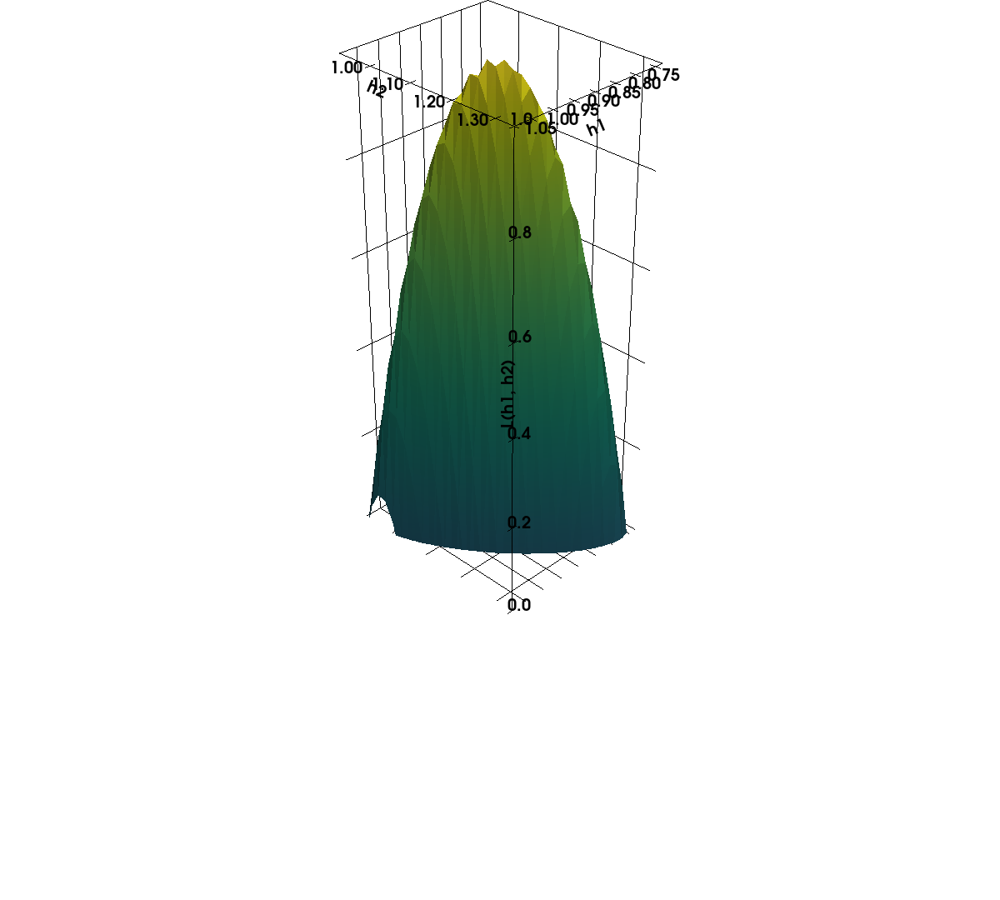

[(2.834413740555763, 3.055475954636775, 2.107112530390739),
 (0.9101108908653259, 1.1311731040477753, 0.18038320541381836),
 (0.0, 0.0, 1.0)]


In [362]:
lwt.cumulants.plot_legendre_pv(use_ipyvtk=False)

In [132]:
df2.iloc[180]

c02      -0.015107
c20      -0.019253
rho_mf    0.207214
Name: MEG1633, dtype: float64